In [30]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from scipy.stats import linregress
import os

In [2]:
# Read the data using pandas
data = pd.read_csv(r"C:\Users\kheney\Documents\scratch\pythonfun\century_data.csv")

# Convert the year int column to a datetimte format
data['Year'] = data['Year'].astype('str')+'-12-31'
data['Year'] = pd.to_datetime(data.Year, format='%Y-%m-%d')

# Drop unnecessary columns
data = data.drop(columns=['Program', 'Period', 'Week Ending',
                          'Geo Level', 'State ANSI', 'Ag District Code',
                          'Zip Code', 'Region', 'watershed_code',
                          'Watershed', 'County ANSI', 'Commodity',
                          'Data Item', 'Domain', 'Domain Category'])

# Create column that holds both state and county
data['State_County'] = data['State'] + '_' + data['County']

In [3]:
data

,Year,State,Ag District,County,Value,CV (%),State_County
0,2021-12-31,ILLINOIS,CENTRAL,DE WITT,209.2,2.4,ILLINOIS_DE WITT
1,2021-12-31,ILLINOIS,CENTRAL,LOGAN,209.5,3.8,ILLINOIS_LOGAN
2,2021-12-31,ILLINOIS,CENTRAL,MACON,221.1,2.4,ILLINOIS_MACON
3,2021-12-31,ILLINOIS,CENTRAL,MARSHALL,214.5,1.3,ILLINOIS_MARSHALL
4,2021-12-31,ILLINOIS,CENTRAL,MASON,197.4,3.6,ILLINOIS_MASON
...,...,...,...,...,...,...,...
90526,1910-12-31,NEBRASKA,SOUTHWEST,HITCHCOCK,14.4,NaN,NEBRASKA_HITCHCOCK
90527,1910-12-31,NEBRASKA,SOUTHWEST,KEITH,19.9,NaN,NEBRASKA_KEITH
90528,1910-12-31,NEBRASKA,SOUTHWEST,LINCOLN,21.3,NaN,NEBRASKA_LINCOLN
90529,1910-12-31,NEBRASKA,SOUTHWEST,PERKINS,9.6,NaN,NEBRASKA_PERKINS


In [4]:
def calculate_slopes(data):
    
    # Get the unique state_county combination
    uniq_st_cnty = np.unique(data['State_County'].values)
    # Empty Dict to hold information
    slopes = {}
    
    # Run a loop through each unique county
    # and calculate slope
    for uniq in uniq_st_cnty:
        # Sort by the Year
        yield_val = data[data['State_County'] == uniq].sort_values(by=['Year'])
        # Set the year as new index
        yield_val = yield_val.set_index('Year')
        # Calculate slope and other information
        slope, inter, r, p, se = linregress(np.arange(1, yield_val.shape[0]+1),
                                            yield_val.Value)
        # Copy the information into the dictionary
        slopes[uniq] = [slope, r, p]
    
    # Create a dataframe of the dictionary
    slopes_df = pd.DataFrame(slopes).T
    # Change the column names
    slopes_df.columns = ['Slope', 'R', 'p']
    # Reset the index
    slopes_df = slopes_df.reset_index()
    
    return slopes_df   

# Apply the function
slopes_data = calculate_slopes(data)
# Save the slope dataframe
slopes_data.to_csv(r"C:\Users\kheney\Documents\scratch\pythonfun\slopes_data.csv")

C:\Users\kheney\AppData\Local\Temp/ipykernel_27448/2972492871.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,1, figsize=(4, 2), dpi=72)


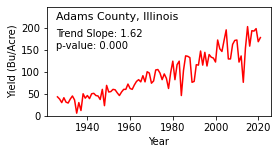

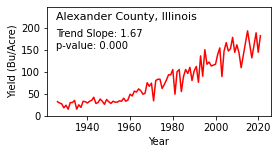

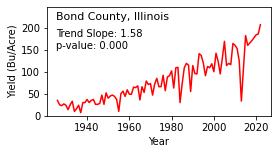

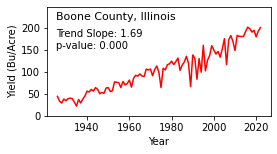

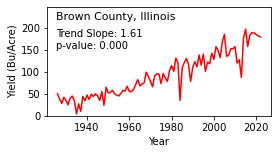

...

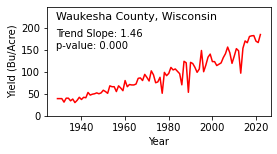

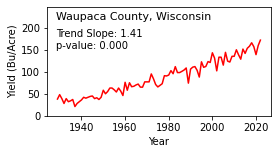

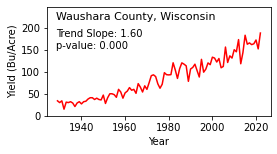

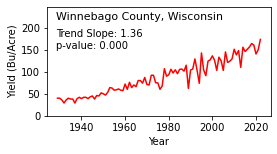

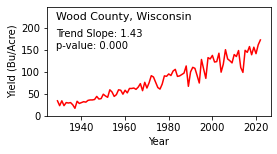

In [5]:
# Get max min yield
# This will help us to have a fixed y-axis 
# for all the data
max_yield = data['Value'].max()
min_yield = data['Value'].min()

# Get the unique state_county combination
uniq_st_cnty = np.unique(data['State_County'].values)

# Run a for loop to get a figure from each county
for uniq in uniq_st_cnty:
    # One more time, we can calcualte the yield
    # because we want to put the statstical information
    # in each plot
    yield_val = data[data['State_County'] == uniq].sort_values(by=['Year'])
    yield_val = yield_val.set_index('Year')
    slope, inter, r, p, se = linregress(np.arange(1, yield_val.shape[0]+1),
                                        yield_val.Value)
    
    # Create a figure object
    fig, ax = plt.subplots(1,1, figsize=(4, 2), dpi=72)

    ax.plot(yield_val['Value'], color='red')
    ax.set_ylabel('Yield (Bu/Acre)')
    ax.set_xlabel('Year')
    ax.set_ylim(bottom=min_yield, top=max_yield)
    ax.text(0.04, 0.96,
            f"{yield_val['County'][0].capitalize()} County, {yield_val['State'][0].capitalize()}",
            ha='left', va='top', transform=ax.transAxes, fontsize=11)
    ax.text(0.04, 0.8, f"Trend Slope: {slope:.2f}\np-value: {p:.3f}",
            ha='left', va='top', transform=ax.transAxes)
    
    # Save the figure
    out_name = rf"C:\Users\kheney\Documents\scratch\pythonfun\{yield_val['County'][0]+'_'+yield_val['State'][0]+'.png'}"
    fig.savefig(out_name, dpi=72, bbox_inches='tight')

In [36]:
# Read the processed shapefile - first make sure there are no nulls
gpd_data = gpd.read_file(r"C:\Users\kheney\Documents\scratch\pythonfun\webmap\century_corn_yield-main\data\shapefile\county_shape.shp")

# Read the slope data
slope_data = pd.read_csv(r"C:\Users\kheney\Documents\scratch\pythonfun\slopes_data.csv")

# Create a custom scale for the legend
# Here we are using the quantile classification to make 
# a custom scale
custom_scale = (slope_data['Slope'].quantile((0, 0.2, 0.4, 0.6, 0.8, 1))).tolist()

# Initialize the map and store it in a m object
m = folium.Map(location=[42, -88], zoom_start=5)

# This is the folium object
ch = folium.Choropleth(
            geo_data=gpd_data, # geopandas object
            data=slope_data, # pandas dataframe
            columns=['index', 'Slope'], # specify the columns to use, we only need these two
            key_on='feature.properties.ST_CNT', # Specify the Id column, which is unique
            bins=custom_scale, # Defining the scale
            fill_color='YlOrRd', # Defining the color scale
            nan_fill_color="White", # If there is nan data, make it white
            fill_opacity=0.7, # Some transparency in the fill color
            line_opacity=0.2, # Same same
            legend_name='Trend', # legend name
            highlight=True, # highlighting shape when hovering
            line_color='black').add_to(m) # Add this object to the defined map

m

In [37]:
# We will need some extra functions
import base64
from folium import IFrame

# Run a for loop for every row in the dataframe
for i in range(gpd_data.shape[0]):
    # Create a png file pathname to get the png files
    png_name = gpd_data.loc[i, 'COUNTY_NM']+'_'+gpd_data.loc[i, 'STATE_NM']
    png = os.path.join("C:/Users/kheney/Documents/scratch/pythonfun/", png_name+'.png')
    
    # Encode the png image and encode it
    encoded = base64.b64encode(open(png, 'rb').read())
    html = '<img src="data:image/png;base64,{}">'.format
    width, height = 4, 2 # Smaller width and height of each figure
    resolution = 72 # Little lower resolution
    # Create the frame, note that we are adding some values (20 and 30).
    # This will help use to avoid scrolling in the popped up figures
    iframe = IFrame(html(encoded.decode('UTF-8')), width=(width*resolution)+20, height=(height*resolution)+30) 
    popup = folium.Popup(iframe, max_width=2650) # This is the popup object
    
    # The style function is important. This is a lambda function with style propoerties.
    # It says the clickable polygon should not have any fill or line colors
    style_function = lambda x: {'fillColor': '#ffffff', 
                                'color':'#000000', 
                                'fillOpacity': 0.1, 
                                'weight': 0.1}
    # Create a geojson object of each polygon. Note that, this is practically invisible.
    b = folium.GeoJson(gpd_data.iloc[i, -1], style_function=style_function)
    
    b.add_child(popup) # Add the popup to it
    ch.add_child(b) # Add the geojson into the map

In [38]:
# Adding map title
text = 'A 100-year Spatiotemporal Trend of Yield in the Corn Belt of U.S.'
title_html = '''
             <h3 align="left" style="font-size:22px"><b>{}</b></h3>
             '''.format(text)

m.get_root().html.add_child(folium.Element(title_html))

# Save the html file
m.save(r"C:\Users\kheney\Documents\scratch\pythonfun\webmap\map.html")